In [ ]:
!pip install pytorch_lightning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 117.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 38.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 95.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 962.5/962.5 kB 64.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlin

In [ ]:
import kagglehub

import imageio
import random
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import torch.nn as nn
import os
import torch
import torchvision.transforms.v2 as transforms
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import v2 as transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch.nn as nn
import torch.nn.functional as F

import pytorch_lightning as pl
import torch.optim as optim
from torchmetrics.classification import MulticlassJaccardIndex

from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.callbacks import EarlyStopping

from pytorch_lightning.loggers import TensorBoardLogger

from pytorch_lightning import Trainer
import warnings
from torch.utils.data import DataLoader



import cv2

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.7'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("xiaose/cityscapes")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/cityscapes


In [ ]:
import os
for root, dirs, files in os.walk(path):
    level = root.replace(path, '').count(os.sep)
    indent = ' ' * 4 * level
    print(f"{indent}{os.path.basename(root)}/")


cityscapes/
    Cityspaces/
        images/
            val/
                munster/
                lindau/
                frankfurt/
            train/
                dusseldorf/
                darmstadt/
                tubingen/
                erfurt/
                bochum/
                krefeld/
                weimar/
                bremen/
                aachen/
                hamburg/
                monchengladbach/
                hanover/
                zurich/
                jena/
                stuttgart/
                strasbourg/
                cologne/
                ulm/
        gtFine/
            val/
                munster/
                lindau/
                frankfurt/
            train/
                dusseldorf/
                darmstadt/
                tubingen/
                erfurt/
                bochum/
                krefeld/
                weimar/
                bremen/
                aachen/
                hamburg/
         

In [ ]:
# Danh sách các thư mục 'train' và 'val'
splits = ['train', 'val']

# Tạo danh sách đường dẫn đến ảnh RGB và mask
image_train_dirs = [os.path.join(path, "Cityspaces/images", 'train')]
mask_train_dirs = [os.path.join(path, "Cityspaces/gtFine", 'train')]

image_val_dirs = [os.path.join(path, "Cityspaces/images", 'train')]
mask_val_dirs = [os.path.join(path, "Cityspaces/gtFine", 'train')]


In [ ]:
image_train_dirs

['/kaggle/input/cityscapes/Cityspaces/images/train']

In [ ]:

splits = ['train', 'val']


def list_all_image_paths(directory_list, suffix=""):
    all_paths = []
    for root_dir in directory_list:
        if not os.path.exists(root_dir):
            print(f"⚠️ Không tìm thấy thư mục: {root_dir}")
            continue
        for city in os.listdir(root_dir):
            city_dir = os.path.join(root_dir, city)
            if not os.path.isdir(city_dir):
                continue
            for file in os.listdir(city_dir):
                if file.endswith(suffix):
                    all_paths.append(os.path.join(city_dir, file))
    return all_paths

# Liệt kê ảnh và mask
image_train_paths = sorted(list_all_image_paths(image_train_dirs, suffix="_leftImg8bit.png"))
mask_train_paths  = sorted(list_all_image_paths(mask_train_dirs,  suffix="_gtFine_labelIds.png"))

image_val_paths = sorted(list_all_image_paths(image_val_dirs, suffix="_leftImg8bit.png"))
mask_val_paths  = sorted(list_all_image_paths(mask_val_dirs,  suffix="_gtFine_labelIds.png"))

image_val_paths, image_test_paths, mask_val_paths, mask_test_paths = train_test_split(
    image_val_paths, mask_val_paths, test_size=0.2, random_state=42
)

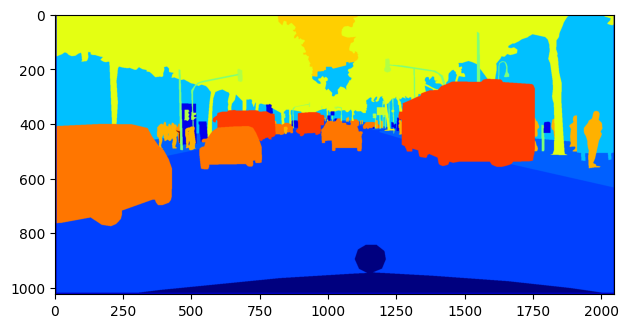

In [ ]:
import matplotlib.pyplot as plt



img = np.array(Image.open(mask_train_paths[12]))  # convert to numpy
plt.imshow(img, cmap='jet')


plt.tight_layout()
plt.show()

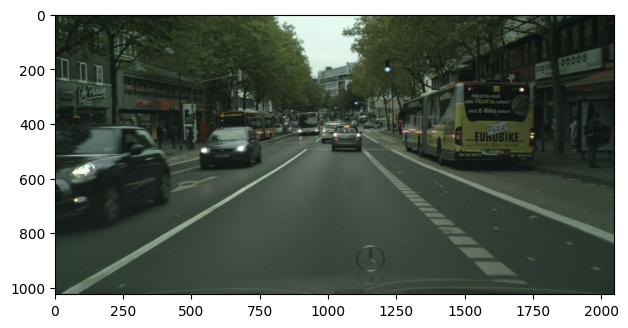

In [ ]:
import matplotlib.pyplot as plt



img = np.array(Image.open(image_train_paths[12]))  # convert to numpy
plt.imshow(img, cmap='jet')




plt.tight_layout()
plt.show()

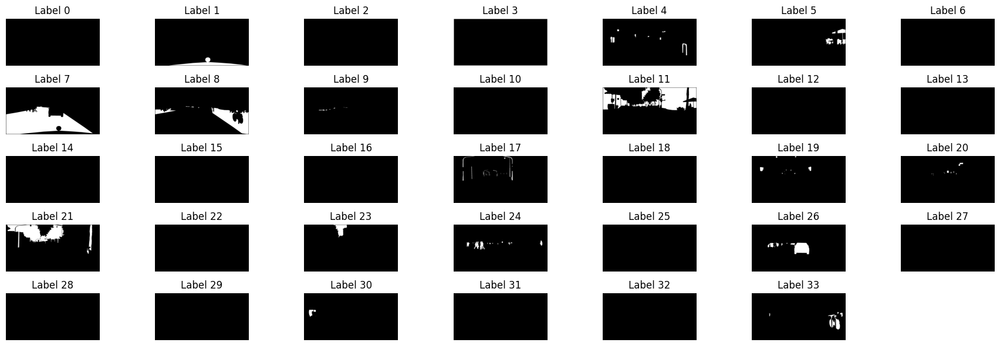

In [ ]:
num_classes = 34
label_ids = list(range(num_classes))
mask_path  = mask_train_paths[12]
mask = Image.open(mask_path)

mask  = np.array(mask)
# Hiển thị từng lớp
plt.figure(figsize=(18, 6))
for i in range(num_classes):
    plt.subplot(5, 7, i + 1)
    binary_mask = np.uint8(mask == i)  # sửa lỗi tại đây
    plt.imshow(binary_mask, cmap='gray')
    plt.title(f"Label {i}")
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
def convert_mask(mask):
    """
    Convert Cityscapes mask to {0: ignore, 1: lane, 2: people, 3: vehicle}
    """
    lane_id = 7
    people_id = 24
    vehicle_ids = [15, 26, 28]
    # Nếu mask là RGB, lấy kênh đầu tiên
    if len(mask.shape) == 3:
        mask = mask[:, :, 0]
    # Khởi tạo với Label 0 (ignore)
    new_mask = np.zeros_like(mask, dtype=np.uint8)
    # Ánh xạ lớp mục tiêu
    new_mask[mask == lane_id] = 1
    new_mask[mask == people_id] = 2
    for vid in vehicle_ids:
        new_mask[mask == vid] = 3
    return new_mask

In [ ]:
path = mask_train_paths[0]
mask = np.array(Image.open(path))  # Load mask gốc
converted = convert_mask(mask)

print("Unique values after conversion:", np.unique(converted))

Unique values after conversion: [0 1 2 3]


In [ ]:
class CustomDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        # Đọc ảnh
        image = np.array(Image.open(self.image_paths[index]))

        # Đọc mask RGB
        mask = np.array(Image.open(self.mask_paths[index]))

        # Áp dụng convert_mask để chuyển đổi giá trị mask
        mask = convert_mask(mask)

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        return image, mask.long()  # Trả về image và mask

In [ ]:


train_transforms = A.Compose([
    A.RandomScale(scale_limit=(1.0, 2.0), p=1.0),
    A.RandomResizedCrop(size=(256, 512), scale=(0.8, 1.0), ratio=(0.75, 1.333)),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.3),
    A.Sharpen(alpha=(0.2, 0.5), lightness=(0.5, 1.0), p=0.3),
    A.GaussianBlur(blur_limit=(3, 5), p=0.2),
    A.Normalize(mean=[0.2942, 0.3274, 0.2879],
                std=[0.1794, 0.1834, 0.1808]),
    ToTensorV2(),
])



val_transforms = A.Compose([
    A.Resize(256,512),
    A.Normalize(mean=[0.2942, 0.3274, 0.2879], std=[0.1794, 0.1834, 0.1808]),
    ToTensorV2()
])

train_dataset = CustomDataset(image_train_paths, mask_train_paths, transform=train_transforms)
val_dataset = CustomDataset(image_val_paths, mask_val_paths, transform=val_transforms)
test_dataset = CustomDataset(image_test_paths, mask_test_paths, transform=val_transforms)



In [ ]:
train_loader = DataLoader(
    train_dataset,
    batch_size=16,  # Reduce from 8 to 4
    shuffle=True,
    num_workers=2,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=16
    ,  # Reduce from 8 to 4
    shuffle=False,
    num_workers=2,
)
val_loader = DataLoader(
    test_dataset,
    batch_size=16
    ,  # Reduce from 8 to 4
    shuffle=False,
    num_workers=2,
)


In [ ]:
train_loader = DataLoader(
    train_dataset,
    batch_size=8,  # Reduce from 8 to 4
    shuffle=True,
    num_workers=2,
)

val_loader = DataLoader(
    val_dataset,
    batch_size=8
    ,  # Reduce from 8 to 4
    shuffle=False,
    num_workers=2,
)


test_loader = DataLoader(
    test_dataset,
    batch_size=8
    ,  # Reduce from 8 to 4
    shuffle=False,
    num_workers=2,
)



In [ ]:
import torch.nn as nn
class ConvBNRelu(nn.Module):
  def __init__(self,in_channels,out_channels,kernel_size = 3, stride=1,padding=1):
    super(ConvBNRelu,self).__init__()
    self.cbr = nn.Sequential(
        nn.Conv2d(in_channels,out_channels,kernel_size = kernel_size,stride = stride,padding = padding),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(inplace=True)
    )
  def forward(self,x):
    out = self.cbr(x)
    return out

In [ ]:
import torch.nn as nn
class CBR(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=1, dilation=1,groups=1, bias=False):
        super(CBR, self).__init__()
        self.cbr = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, groups, dilation, bias=bias),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        output = self.cbr(x)
        return output


class CB(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=1, dilation=1,groups=1, bias=False):
        super(CB, self).__init__()
        self.cb = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, dilation=dilation, groups=groups,
                      bias=bias),
            nn.BatchNorm2d(out_channels),
        )

    def forward(self, x):
        output = self.cb(x)
        return output

In [ ]:
class StemBlock(nn.Module):
    def __init__(self, out_channels):

        super(StemBlock, self).__init__()

        # Nhánh chính (Main Branch)
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, out_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

        # Nhánh phụ (Branch 1)
        self.branch1 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels // 2, kernel_size=1, stride=1),
            nn.BatchNorm2d(out_channels // 2),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels // 2, out_channels, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

        # Nhánh phụ (Branch 2) - Max Pooling
        self.branch2 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # Convolution cuối cùng sau concatenation
        self.final_conv = nn.Conv2d(out_channels * 2, out_channels, kernel_size=3, padding=1)

    def forward(self, x):
        x1 = self.conv1(x)  # [H/2 x W/2 x C]

        x2 = self.branch1(x1)  # [H/4 x W/4 x C]

        x3 = self.branch2(x1)  # [H/4 x W/4 x C]

        x_cat = torch.cat([x2, x3], dim=1)  # [H/4 x W/4 x 2C]

        out = self.final_conv(x_cat)  # [H/4 x W/4 x C]

        return out

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class FastAttentionBlock(nn.Module):
    def __init__(self, in_channels, reduction=4):
        super(FastAttentionBlock, self).__init__()
        reduced_channels = in_channels // reduction

        self.query_conv = nn.Sequential(
            nn.Conv2d(in_channels, reduced_channels, kernel_size=1),
            nn.BatchNorm2d(reduced_channels)
        )
        self.key_conv = nn.Sequential(
            nn.Conv2d(in_channels, reduced_channels, kernel_size=1),
            nn.BatchNorm2d(reduced_channels)
        )
        self.value_conv = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, kernel_size=1),
            nn.BatchNorm2d(in_channels)
        )

        # Projection back to original channel dimension
        self.proj_conv = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, kernel_size=1),
            nn.BatchNorm2d(in_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        B, C, H, W = x.size()

        Q = self.query_conv(x).view(B, -1, H * W)              # (B, C', HW)
        K = self.key_conv(x).view(B, -1, H * W)                # (B, C', HW)
        V = self.value_conv(x).view(B, C, H * W)               # (B, C, HW)

        # L2 normalization
        Q = F.normalize(Q, p=2, dim=1)  # Across channel dim
        K = F.normalize(K, p=2, dim=1)

        # Efficient attention: (Q x (K^T x V^T))^T
        KV = torch.bmm(K, V.permute(0, 2, 1))                  # (B, C', C)
        attention = torch.bmm(Q.permute(0, 2, 1), KV)          # (B, HW, C)
        attention = attention.permute(0, 2, 1).view(B, C, H, W)  # (B, C, H, W)

        out = self.proj_conv(attention + x)  # Residual + projection
        return out


In [ ]:
import torch
import torch.nn as nn

class FusionBlock(nn.Module):
    def __init__(self, channels, scale_factor, decoder_in_channels=None):

        super(FusionBlock, self).__init__()
        self.up = nn.Upsample(scale_factor=scale_factor, mode='bilinear', align_corners=False)
        self.decoder_in_channels = decoder_in_channels if decoder_in_channels is not None else channels
        # Channel adjustment for decoder_input to match fa_out channels
        self.channel_adjust = nn.Conv2d(self.decoder_in_channels, channels, kernel_size=1) if self.decoder_in_channels != channels else nn.Identity()
        self.conv_bn = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, fa_out, decoder_input):
        # Adjust channels of decoder_input to match fa_out
        decoder_input = self.channel_adjust(decoder_input)
        # Upsample the adjusted decoder_input
        upsampled = self.up(decoder_input)
        # Add fa_out and upsampled (now same channels)
        fused = self.relu(fa_out + upsampled)
        out = self.conv_bn(fused)
        return out


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
class DropPath(nn.Module):
    def __init__(self, drop_prob: float = 0.):
        super(DropPath, self).__init__()
        self.drop_prob = drop_prob

    def forward(self, x):
        if self.drop_prob == 0. or not self.training:
            return x
        keep_prob = 1 - self.drop_prob
        shape = (x.shape[0],) + (1,) * (x.ndim - 1)  # chỉ dropout theo batch, không theo channel
        random_tensor = keep_prob + torch.rand(shape, dtype=x.dtype, device=x.device)
        random_tensor.floor_()  # chuyển sang nhị phân: 0 hoặc 1
        output = x / keep_prob * random_tensor
        return output
class ConvNeXtBlock(nn.Module):
    def __init__(self, dim, drop_path=0., layer_scale_init_value=1e-6):
        super(ConvNeXtBlock, self).__init__()
        self.dwconv = nn.Conv2d(dim, dim, kernel_size=7, padding=3, groups=dim)
        self.norm = nn.LayerNorm(dim, eps=1e-6)
        self.pwconv1 = nn.Linear(dim, 4 * dim)
        self.act = nn.GELU()
        self.pwconv2 = nn.Linear(4 * dim, dim)
        self.gamma = nn.Parameter(layer_scale_init_value * torch.ones((dim)), requires_grad=True) if layer_scale_init_value > 0 else None
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()

    def forward(self, x):
        input_tensor = x
        x = self.dwconv(x)
        x = x.permute(0, 2, 3, 1)
        x = self.norm(x)
        x = self.pwconv1(x)
        x = self.act(x)
        x = self.pwconv2(x)
        if self.gamma is not None:
            x = self.gamma * x
        x = x.permute(0, 3, 1, 2)
        x = input_tensor + self.drop_path(x)
        return x

class DownsamplingLayer(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        # LayerNorm được áp dụng trước Conv2d trong kiến trúc ConvNeXt
        self.norm = nn.LayerNorm(in_channels, eps=1e-6)
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=2, stride=2)

    def forward(self, x):
        # x có dạng (N, C, H, W)
        x_permuted = x.permute(0, 2, 3, 1) # (N, H, W, C)
        x_normed = self.norm(x_permuted)
        x_restored = x_normed.permute(0, 3, 1, 2) # (N, C, H, W)
        return self.conv(x_restored)

In [ ]:
class SeparableSelfAttention(nn.Module):
    def __init__(self, input_dim, output_dim=None, k_dim=None):

        super(SeparableSelfAttention, self).__init__()
        if output_dim is None:
            output_dim = input_dim

        self.input_dim = input_dim
        self.output_dim = output_dim

        self.linear_I = nn.Linear(input_dim, 1)

        self.linear_K = nn.Linear(input_dim, input_dim)

        self.linear_V = nn.Linear(input_dim, input_dim)

        self.linear_Y = nn.Linear(input_dim, output_dim)

        # Hàm kích hoạt
        self.sigmoid = nn.Sigmoid()
        self.relu = nn.ReLU()

    def forward(self, x):
        # --- Nhánh I (Context Scores) ---
        I = self.linear_I(x)
        context_scores = self.sigmoid(I)

        # --- Nhánh K (Keys) ---

        K = self.linear_K(x)  # (batch_size, k, d)

        # --- Tính Context Vector ---
        # context_scores: (batch_size, k, 1)
        weighted_K = context_scores * K # (batch_size, k, d)
        # Summation over k dimension
        context_vector = torch.sum(weighted_K, dim=1) # (batch_size, d)

        # --- Nhánh V (Values) ---
        V_intermediate = self.linear_V(x) # (batch_size, k, d)
        V = self.relu(V_intermediate)    # (batch_size, k, d)

        # --- Kết hợp Context Vector và Values ---
        context_vector_expanded = context_vector.unsqueeze(1) # (batch_size, 1, d)
        combined_representation = context_vector_expanded * V # (batch_size, k, d)

        # --- Lớp Linear cuối cùng ---
        Y = self.linear_Y(combined_representation) # (batch_size, k, output_dim)


        return Y


In [ ]:
import pytorch_lightning as pl

from torchmetrics.classification import MulticlassJaccardIndex

class CustomModelConvNeXt(pl.LightningModule):
    def __init__(self, num_classes=19, layer_scale_init_value=1e-6):
        super(CustomModelConvNeXt, self).__init__()
        self.save_hyperparameters()
        self.num_classes = num_classes

        self.stem = StemBlock(16)

        self.downsample1 = DownsamplingLayer(16, 32)
        self.stage1_blocks = nn.Sequential(
            ConvNeXtBlock(dim=32, layer_scale_init_value=layer_scale_init_value)
        )

        self.downsample2 = DownsamplingLayer(32, 64)
        self.stage2_blocks = nn.Sequential(
            ConvNeXtBlock(dim=64, layer_scale_init_value=layer_scale_init_value)
        )

        self.downsample3 = DownsamplingLayer(64, 128)
        self.stage3_blocks = nn.Sequential(
            ConvNeXtBlock(dim=128, layer_scale_init_value=layer_scale_init_value),
            ConvNeXtBlock(dim=128, layer_scale_init_value=layer_scale_init_value),
            ConvNeXtBlock(dim=128, layer_scale_init_value=layer_scale_init_value)
        )


        self.attention_1 = SeparableSelfAttention(input_dim=32)
        self.attention_2 = SeparableSelfAttention(input_dim=64)
        self.attention_3 = SeparableSelfAttention(input_dim=128)


        self.fusion_3 = FusionBlock(128, scale_factor=1, decoder_in_channels=128) # att_out=128, skip(ge3)=128
        self.fusion_2 = FusionBlock(64, scale_factor=2, decoder_in_channels=128)  # att_out=64, skip(de3)=128
        self.fusion_1 = FusionBlock(32, scale_factor=2, decoder_in_channels=64)   # att_out=32, skip(de2)=64


        self.classifier = nn.Sequential(
            nn.Conv2d(224, 224, kernel_size=3, padding=1),
            nn.BatchNorm2d(224),
            nn.ReLU(inplace=True),
            nn.Dropout2d(p=0.3),  # Dropout2d cho spatial dropout
            nn.Conv2d(224, self.num_classes, kernel_size=1)
        )

        self.iou_metric = MulticlassJaccardIndex(num_classes=self.num_classes, ignore_index=0 if self.num_classes > 1 else None)


    def _apply_attention(self, attention_block, x_in):
        B, C, H, W = x_in.shape
        x_seq = x_in.flatten(2).permute(0, 2, 1)

        att_out_seq = attention_block(x_seq)

        x_att_out = att_out_seq.permute(0, 2, 1).reshape(B, C, H, W)
        return x_att_out

    def forward(self, x):
        x0 = self.stem(x)

        x1_down = self.downsample1(x0)
        ge1 = self.stage1_blocks(x1_down)

        x2_down = self.downsample2(ge1)
        ge2 = self.stage2_blocks(x2_down)

        x3_down = self.downsample3(ge2)
        ge3 = self.stage3_blocks(x3_down)

        # Decoder với SeparableSelfAttention
        de3_fa = self._apply_attention(self.attention_3, ge3)
        de3 = self.fusion_3(de3_fa, ge3) # ge3 là skip connection

        de2_fa = self._apply_attention(self.attention_2, ge2)
        de2 = self.fusion_2(de2_fa, de3) # de3 là đầu vào từ tầng sâu hơn (đã upsample trong fusion)

        de1_fa = self._apply_attention(self.attention_1, ge1)
        de1 = self.fusion_1(de1_fa, de2) # de2 là đầu vào từ tầng sâu hơn (đã upsample trong fusion)

        target_size = de1.shape[2:]
        de3_up = F.interpolate(de3, size=target_size, mode='bilinear', align_corners=False)
        de2_up = F.interpolate(de2, size=target_size, mode='bilinear', align_corners=False)

        out = torch.cat([de1, de2_up, de3_up], dim=1)
        out = self.classifier(out)

        out = F.interpolate(out, size=x.shape[2:], mode='bilinear', align_corners=False) # Upsample về kích thước ảnh gốc
        return out


#Loss Function


In [ ]:
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts

class DiceLoss(nn.Module):
    def __init__(self, smooth=1., weights=None, ignore_index=255):
        super().__init__()
        self.smooth = smooth
        self.weights = weights
        self.ignore_index = ignore_index

    def forward(self, logits, targets):
        num_classes = logits.shape[1]
        logits = F.softmax(logits, dim=1)

        # Resize targets if necessary
        if logits.shape[2:] != targets.shape[1:]:
            targets = F.interpolate(targets.unsqueeze(1).float(), size=logits.shape[2:], mode='nearest').squeeze(1).long()

        # Mask out ignore_index
        valid_mask = (targets != self.ignore_index)

        # One-hot encode valid targets only
        targets_one_hot = F.one_hot(torch.clamp(targets, 0, num_classes - 1), num_classes=num_classes).permute(0, 3, 1, 2).float()
        targets_one_hot *= valid_mask.unsqueeze(1)  # apply mask to one-hot

        logits = logits * valid_mask.unsqueeze(1)

        dims = (0, 2, 3)
        intersection = torch.sum(logits * targets_one_hot, dims)
        cardinality = torch.sum(logits + targets_one_hot, dims)

        dice = (2. * intersection + self.smooth) / (cardinality + self.smooth)

        if self.weights is not None:
            dice = dice * self.weights.to(logits.device)

        return 1. - dice.mean()

# FocalLoss for edge detection
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0, reduction='mean', ignore_index=255):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        self.ignore_index = ignore_index

    def forward(self, inputs, targets):
        # Create a valid mask
        valid_mask = (targets != self.ignore_index)

        # Apply sigmoid, binary targets expected (0 or 1)
        BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets.float(), reduction='none')

        pt = torch.exp(-BCE_loss)
        F_loss = self.alpha * (1 - pt) ** self.gamma * BCE_loss

        # Mask out ignored elements
        F_loss = F_loss * valid_mask.float()

        if self.reduction == 'mean':
            return F_loss.sum() / valid_mask.sum().clamp(min=1)  # avoid division by zero
        elif self.reduction == 'sum':
            return F_loss.sum()
        return F_loss



class OHEMCrossEntropyLoss(nn.Module):
    def __init__(self, thresh=0.7, min_kept=1000, ignore_index=255):
        super().__init__()
        self.thresh = thresh  # Ngưỡng xác suất để xác định pixel dễ
        self.min_kept = min_kept  # Số lượng pixel tối thiểu để giữ
        self.ignore_index = ignore_index
        self.criterion = nn.CrossEntropyLoss(ignore_index=ignore_index, reduction='none')

    def forward(self, logits, targets):
        # Tính mất mát cho tất cả pixel
        loss = self.criterion(logits, targets)

        # Lấy xác suất của lớp dự đoán
        probs = F.softmax(logits, dim=1)
        max_probs, _ = probs.max(dim=1)

        # Tạo mask cho các pixel khó (hard examples)
        mask = (max_probs < self.thresh) & (targets != self.ignore_index)

        # Chọn các pixel có mất mát cao
        loss_flat = loss.view(-1)
        mask_flat = mask.view(-1)
        valid_loss = loss_flat[mask_flat]

        # Nếu số pixel hợp lệ quá ít, giữ ít nhất min_kept pixel có mất mát cao
        if valid_loss.numel() < self.min_kept:
            topk_loss, _ = torch.topk(loss_flat, k=min(self.min_kept, loss_flat.numel()))
            valid_loss = topk_loss

        # Tính trung bình mất mát trên các pixel được chọn
        return valid_loss.mean() if valid_loss.numel() > 0 else loss.mean()


In [ ]:
class SegmentationModel(pl.LightningModule):
    def __init__(self, model, num_classes=4, learning_rate=1e-3, weights=None):
        super().__init__()
        self.save_hyperparameters()
        self.model = model
        self.criterion_seg = OHEMCrossEntropyLoss(thresh=0.7, min_kept=1000, ignore_index=255)
        self.iou_metric = MulticlassJaccardIndex(num_classes=num_classes, ignore_index=255)
        self.learning_rate = learning_rate
        self.weights = weights

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        images, masks = batch[0], batch[1]
        outputs = self(images)
        loss = self.criterion_seg(outputs, masks)
        self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, masks = batch[0], batch[1]
        outputs = self(images)
        # Debugging: Print shapes
        if outputs.shape[2:] != masks.shape[1:]:
            outputs = F.interpolate(outputs, size=masks.shape[1:], mode='bilinear', align_corners=False)
        # Ensure class indices are valid
        preds = outputs.argmax(dim=1)

        iou = self.iou_metric(preds, masks)
        self.log('val_mIoU', iou, on_step=True, on_epoch=True, prog_bar=True)
        return iou

    def test_step(self, batch, batch_idx):
        images, masks = batch[0], batch[1]
        outputs = self(images)
        iou = self.iou_metric(outputs.argmax(dim=1), masks)
        self.log('test_iou', iou, prog_bar=True)
        return iou

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=self.learning_rate)
        scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2)
        return {
            'optimizer': optimizer,
            'lr_scheduler': {
                'scheduler': scheduler,
                'interval': 'step',
                'frequency': 1
            }
        }

In [ ]:
import time

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [ ]:
import torch
import time

model = CustomModelConvNeXt(num_classes=5).to(device)

model.eval()

dummy_input = torch.randn(1, 3, 512, 512).to(device)

with torch.no_grad():
    for _ in range(1):
        model(dummy_input)

start_time = time.time()
with torch.no_grad():
    output = model(dummy_input)
end_time = time.time()

elapsed_time = end_time - start_time
fps = 1 / elapsed_time if elapsed_time > 0 else float('inf')


print(f"Model output shape: {output.shape}")
print(f"Time for one inference: {elapsed_time:.4f} seconds")
print(f"FPS: {fps:.2f}")

Model output shape: torch.Size([1, 5, 512, 512])
Time for one inference: 0.0051 seconds
FPS: 194.20


In [ ]:
for images, masks in train_loader:
    if masks.dim() == 4:
        masks = masks.squeeze(1)
    labels, counts = torch.unique(masks, return_counts=True)
    for label, count in zip(labels.tolist(), counts.tolist()):
        print(f"Label {label}: {count} pixels")
    break


In [ ]:
def calculate_class_weights(pixel_counts):
    """
    Tính trọng số lớp dựa trên nghịch đảo căn bậc hai của số pixel.

    Args:
        pixel_counts (list): Số pixel của từng lớp [label_0, label_1, label_2, label_3]

    Returns:
        torch.Tensor: Trọng số chuẩn hóa cho các lớp
    """
    # Tính nghịch đảo căn bậc hai
    inverse_sqrt = [1.0 / np.sqrt(count) for count in pixel_counts]
    # Chuẩn hóa để tổng = 1
    total = sum(inverse_sqrt)
    weights = [w / total for w in inverse_sqrt]
    return torch.tensor(weights, dtype=torch.float32)

# Pixel counts từ dữ liệu
pixel_counts = [616884  , 342849  , 19996  ,68847 ]

# Tính trọng số tự động
auto_weights = calculate_class_weights(pixel_counts)
print("Trọng số tự động (chuẩn hóa):", auto_weights)

# Trọng số thủ công (ưu tiên nhãn 2 và 3)
manual_weights = torch.tensor([0.3, 0.3, 2.0, 1.0], dtype=torch.float32)
print("Trọng số thủ công:", manual_weights)

Trọng số tự động (chuẩn hóa): tensor([0.0918, 0.1232, 0.5101, 0.2749])
Trọng số thủ công: tensor([0.3000, 0.3000, 2.0000, 1.0000])


In [ ]:
custom = CustomModelConvNeXt(num_classes=4)
checkpoint_path = "/content/drive/MyDrive/car driving new/checkpoints/best-checkpoint-v2.ckpt"
model = SegmentationModel.load_from_checkpoint(
    checkpoint_path,
    model = custom,
    num_classes=4,
    learning_rate=2e-4,
    strict = False
)

/usr/local/lib/python3.11/dist-packages/pytorch_lightning/utilities/parsing.py:209: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.


# Train

In [ ]:
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning import Trainer

checkpoint_callback = ModelCheckpoint(
    monitor='val_mIoU',
    dirpath='/content/drive/MyDrive/car driving new/checkpoints',
    mode='max',
    save_top_k=1,
    filename='best-checkpoint',
    save_last=True,
    verbose = True
)

early_stopping_callback = EarlyStopping(
    monitor='val_mIoU',
    patience=10,
    mode='max'
)

trainer = Trainer(
    max_epochs=150,
    callbacks=[checkpoint_callback, early_stopping_callback],
    accelerator="auto",
    devices="auto",
    precision=16,
    default_root_dir = '/content/drive/MyDrive/car driving new/lightning_logs'
)
trainer.fit(model, train_dataloaders=train_loader, val_dataloaders=val_loader)


INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type                   | Params | Mode 
-----------------------------------------------------------------
0 | model         | CustomModelConvNeXt    | 1.4 M  | train
1 | criterion_seg | OHEMCrossEntropyLoss   | 0      | train
2 | iou_metric    | MulticlassJaccardIndex | 0      | train
-----------------------------------------------------------------
1.4 M     Trainable params
0         Non-trainable params
1.4 M     Total params
5.770     Total estimated model params size (MB)
137       Modules in train mode
0  

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 93: 'val_mIoU' reached 0.39679 (best 0.39679), saving model to '/content/drive/MyDrive/car driving new/checkpoints/best-checkpoint-v5.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 186: 'val_mIoU' reached 0.44916 (best 0.44916), saving model to '/content/drive/MyDrive/car driving new/checkpoints/best-checkpoint-v5.ckpt' as top 1


# Evaluation

In [ ]:
checkpoint_path = "/content/drive/MyDrive/car driving new/checkpoints/best-checkpoint-v4.ckpt"
model = SegmentationModel.load_from_checkpoint(
    checkpoint_path,
    num_classes=4,
    learning_rate=2e-4,

)

# Khởi tạo Trainer
trainer = pl.Trainer(accelerator="gpu" if torch.cuda.is_available() else "cpu", devices=1)

# Chạy test
trainer.test(model, dataloaders=test_loader)

INFO:pytorch_lightning.utilities.rank_zero:Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_iou          │    0.7337156534194946     │
└───────────────────────────┴───────────────────────────┘

[{'test_iou': 0.7337156534194946}]

# Test


--- Sample 1 ---
GT mask classes: [0 1 2 3]
Pred mask classes: [0 1 2 3]


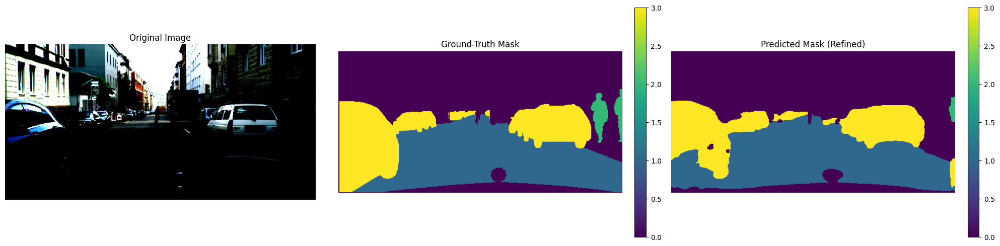


--- Sample 2 ---
GT mask classes: [0 1 2 3]
Pred mask classes: [0 1 2 3]


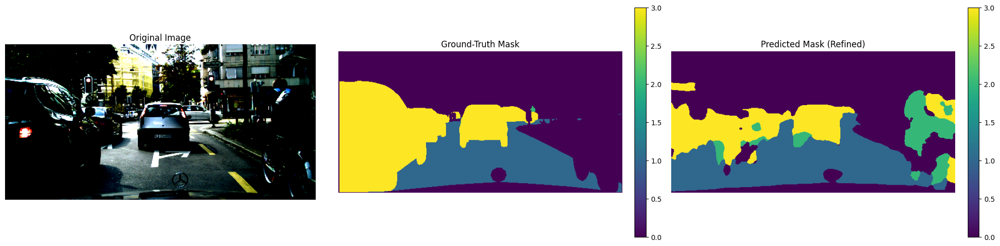


--- Sample 3 ---
GT mask classes: [0 1 2]
Pred mask classes: [0 1]


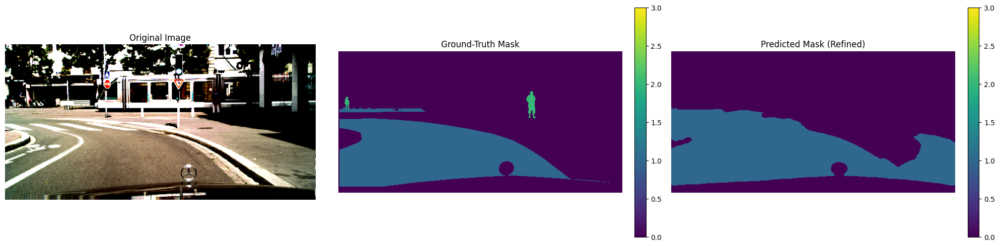


--- Sample 4 ---
GT mask classes: [0 1 3]
Pred mask classes: [0 1 3]


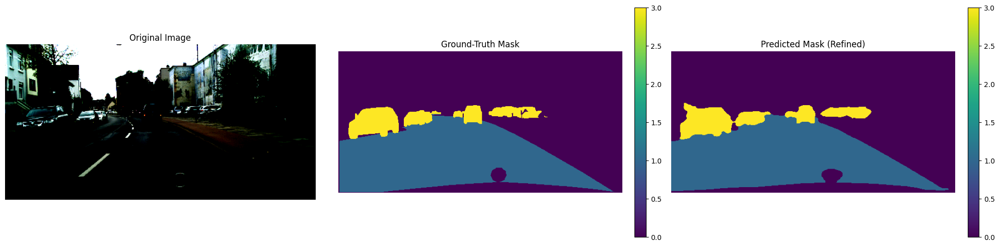


--- Sample 5 ---
GT mask classes: [0 1 2 3]
Pred mask classes: [0 1 2]


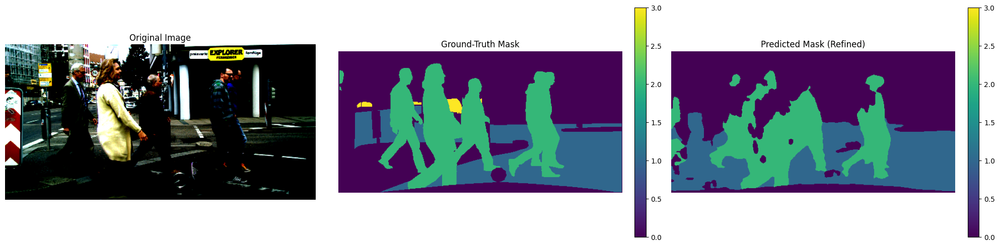


--- Sample 6 ---
GT mask classes: [0 1 2 3]
Pred mask classes: [0 1 2 3]


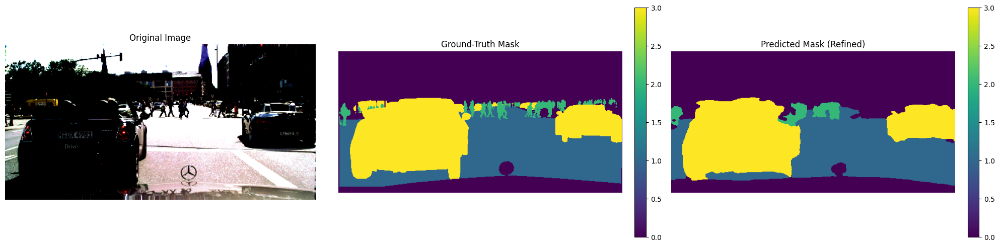


--- Sample 7 ---
GT mask classes: [0 1 2 3]
Pred mask classes: [0 1 3]


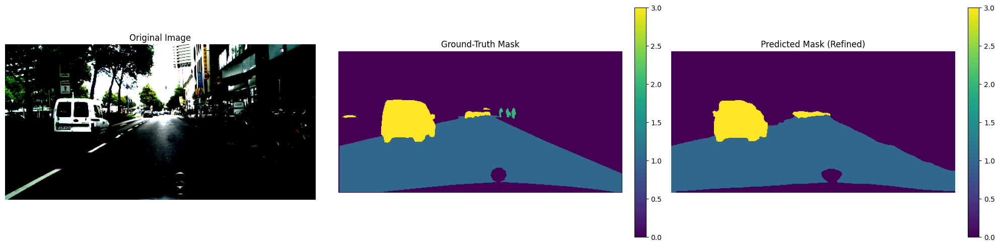


--- Sample 8 ---
GT mask classes: [0 1 2 3]
Pred mask classes: [0 1 3]


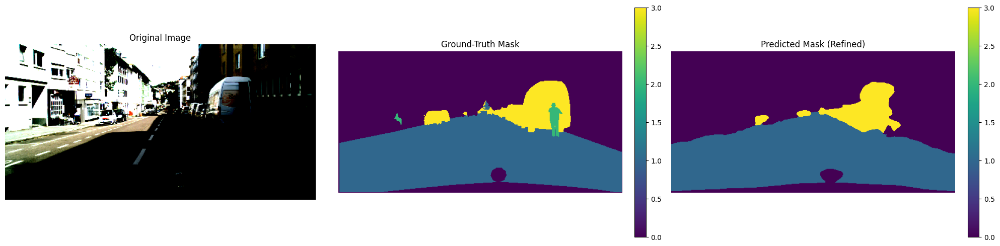


--- Sample 9 ---
GT mask classes: [0 1 2 3]
Pred mask classes: [0 1 2]


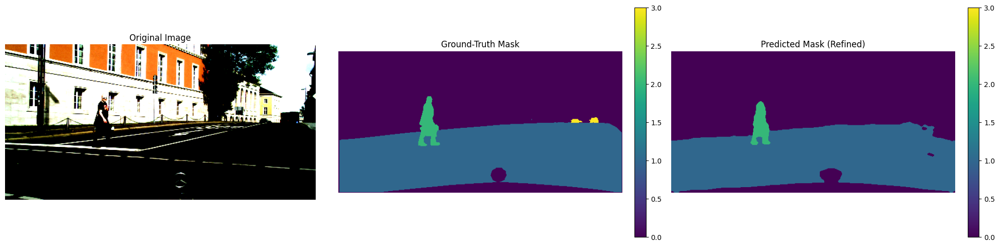


--- Sample 10 ---
GT mask classes: [0 1 3]
Pred mask classes: [0 1 3]


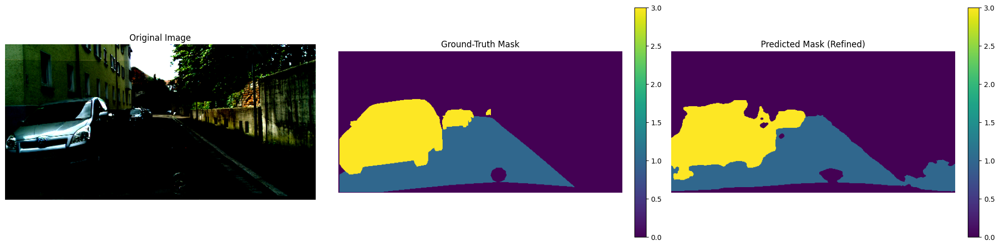

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2

# ==== 1. Hậu kỳ mask ====
def remove_small_regions(mask, min_size=200):
    for label in np.unique(mask):
        mask_label = (mask == label).astype(np.uint8)
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask_label)
        for i in range(1, num_labels):
            if stats[i, cv2.CC_STAT_AREA] < min_size:
                mask[labels == i] = 0
    return mask

def refine_mask(mask, ignore_mask=None):
    # Nếu có ignore_mask, giữ nguyên các pixel ignore
    if ignore_mask is not None:
        original_mask = mask.copy()
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
        closed = cv2.morphologyEx(mask.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
        cleaned = remove_small_regions(closed, min_size=200)
        # Khôi phục các pixel ignore về giá trị ban đầu
        cleaned[ignore_mask] = original_mask[ignore_mask]
        return cleaned
    else:
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
        closed = cv2.morphologyEx(mask.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
        return remove_small_regions(closed, min_size=200)

# ==== 2. Device ====
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ==== 3. Load model ====
num_classes = 4 # 3 lớp mục tiêu: vạch - đường - xe
model = CustomModelConvNeXt(num_classes=num_classes)
model.to(device)

ckpt_path = "/content/drive/MyDrive/car driving new/checkpoints/best-checkpoint-v4.ckpt"
ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
state_dict = {k.replace("model.", ""): v for k, v in ckpt['state_dict'].items()}
model.load_state_dict(state_dict,strict=False)
model.eval()

# ==== 3. Hiển thị prediction ====
num_samples = 10
count = 0
num_classes = 4

plt.get_cmap('tab20', num_classes)

with torch.no_grad():
    for batch in test_loader:
        images = batch[0].to(device)
        gt_masks = batch[1].cpu().numpy()

        if gt_masks.ndim == 4:
            gt_masks = gt_masks[:, 0]

        outputs = model(images)

        # outputs sẽ là 1 dict: {'seg', 'aux', 'edge_16', 'edge_8'}
        seg_outputs = outputs

        pred_masks = torch.argmax(seg_outputs, dim=1).cpu().numpy()

        # refine từng mask
        for j in range(pred_masks.shape[0]):
            pred_masks[j] = refine_mask(pred_masks[j])

        # Đưa ảnh edge về numpy

        original_images = images.cpu().permute(0, 2, 3, 1).numpy().clip(0, 1)

        for i in range(images.size(0)):
            if count >= num_samples:
                break

            image_np = (original_images[i] * 255).astype(np.uint8)
            if image_np.shape[2] == 1:
                image_np = np.repeat(image_np, 3, axis=2)
            image_pil = Image.fromarray(image_np)

            print(f"\n--- Sample {count + 1} ---")
            print("GT mask classes:", np.unique(gt_masks[i]))
            print("Pred mask classes:", np.unique(pred_masks[i]))

            plt.figure(figsize=(20, 5))

            plt.subplot(1, 3, 1)
            plt.imshow(image_pil)
            plt.title("Original Image")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            im2 = plt.imshow(gt_masks[i], vmin=0, vmax=num_classes - 1)
            plt.title("Ground-Truth Mask")
            plt.axis("off")
            plt.colorbar(im2, fraction=0.046, pad=0.04)

            plt.subplot(1, 3, 3)
            im3 = plt.imshow(pred_masks[i], vmin=0, vmax=num_classes - 1)
            plt.title("Predicted Mask (Refined)")
            plt.axis("off")
            plt.colorbar(im3, fraction=0.046, pad=0.04)



            plt.tight_layout()
            plt.show()

            count += 1

        if count >= num_samples:
            break


#Confusion matrix

In [ ]:
def remove_small_regions(mask, min_size=200):
    for label in np.unique(mask):
        if label == 0:  # ignore
            continue
        mask_label = (mask == label).astype(np.uint8)
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask_label)
        for i in range(1, num_labels):
            if stats[i, cv2.CC_STAT_AREA] < min_size:
                mask[labels == i] = 0
    return mask

def refine_mask(mask):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    closed = cv2.morphologyEx(mask.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
    return remove_small_regions(closed, min_size=200)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 4  # {0: ignore, 1: lane, 2: people, 3: vehicle}

model = CustomModelConvNeXt(num_classes=num_classes)
model.to(device)

ckpt_path = "/content/drive/MyDrive/car driving new/checkpoints/best-checkpoint-v4.ckpt"
ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
state_dict = {k.replace("model.", ""): v for k, v in ckpt['state_dict'].items()}
model.load_state_dict(state_dict,strict=False)
model.eval()

all_gt, all_pred = [], []

with torch.no_grad():
    for batch in test_loader:
        images = batch[0].to(device)
        gt_masks = batch[1].cpu().numpy()

        outputs = model(images)
        pred_masks = torch.argmax(outputs, dim=1).cpu().numpy()

        for i in range(pred_masks.shape[0]):
            pred = refine_mask(pred_masks[i])
            gt = gt_masks[i]

            # Bỏ qua pixels ignore (label = 0)
            valid = gt > 0
            all_gt.extend(gt[valid])
            all_pred.extend(pred[valid])

labels = [1, 2, 3]  # lane, people, vehicle
label_names = ['Lane', 'People', 'Vehicle']
cm = confusion_matrix(all_gt, all_pred, labels=labels)

# --- Bắt đầu phần tính toán các chỉ số hiệu suất từ Confusion Matrix ---
print("--- Calculating Performance Metrics ---")

true_positives = np.diag(cm)
false_positives = np.sum(cm, axis=0) - true_positives
false_negatives = np.sum(cm, axis=1) - true_positives

iou_scores = []
dice_scores = []
precision_scores = []
recall_scores = []

# Để lưu trữ dữ liệu vào DataFrame
import pandas as pd
metrics_df_data = {}

# Tính toán chỉ số cho từng lớp
for i, class_name in enumerate(label_names):
    tp = true_positives[i]
    fp = false_positives[i]
    fn = false_negatives[i]

    # Để tránh lỗi chia cho 0
    iou = tp / (tp + fp + fn) if (tp + fp + fn) > 0 else 0
    dice = (2 * tp) / (2 * tp + fp + fn) if (2 * tp + fp + fn) > 0 else 0
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    iou_scores.append(iou)
    dice_scores.append(dice)
    precision_scores.append(precision)
    recall_scores.append(recall)

    metrics_df_data[class_name] = {
        'IoU': iou,
        'Dice Score': dice,
        'Precision': precision,
        'Recall': recall
    }

# Tính toán các chỉ số trung bình
mean_iou = np.mean(iou_scores)
mean_dice = np.mean(dice_scores)

# Overall Pixel Accuracy
# Tổng số pixel được phân loại đúng (tổng đường chéo chính) chia cho tổng số pixel đã xem xét (tổng tất cả các phần tử trong CM)
overall_pixel_accuracy = np.sum(true_positives) / np.sum(cm) if np.sum(cm) > 0 else 0


# --- Hiển thị Global Performance Matrix (dạng bảng) ---
# Thêm các chỉ số tổng thể vào DataFrame
metrics_df_data['Mean IoU'] = {'IoU': mean_iou, 'Dice Score': np.nan, 'Precision': np.nan, 'Recall': np.nan}
metrics_df_data['Mean Dice Score'] = {'IoU': np.nan, 'Dice Score': mean_dice, 'Precision': np.nan, 'Recall': np.nan}
metrics_df_data['Overall Pixel Accuracy'] = {'IoU': np.nan, 'Dice Score': np.nan, 'Precision': overall_pixel_accuracy, 'Recall': np.nan} # Đặt OPA vào cột Precision cho dễ nhìn

performance_df = pd.DataFrame.from_dict(metrics_df_data, orient='index')

print("\n--- Global Performance Metrics (Table) ---")
# Sử dụng .round(4) để làm tròn và .fillna('') để các ô NaN không hiển thị
print(performance_df.round(4).fillna(''))


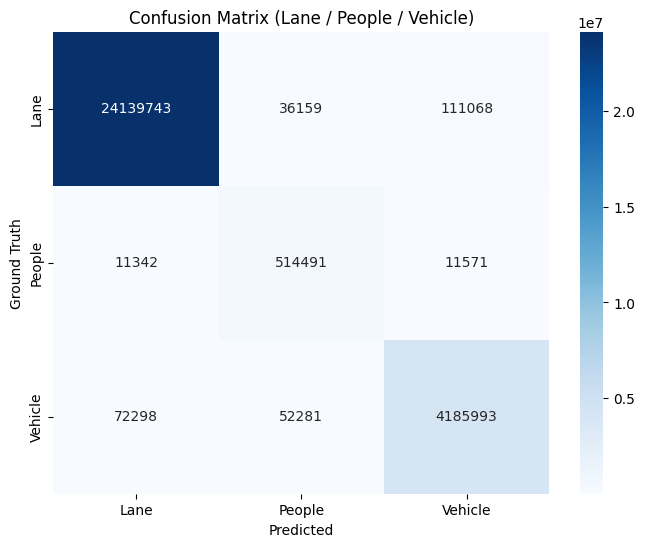

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
labels = [1, 2, 3]  # lane, people, vehicle
label_names = ['Lane', 'People', 'Vehicle']
cm = confusion_matrix(all_gt, all_pred, labels=labels)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel("Predicted")
plt.ylabel("Ground Truth")
plt.title("Confusion Matrix (Lane / People / Vehicle)")
plt.show()

In [ ]:
device = 'cuda'

In [ ]:
num_classes = 4 # 3 lớp mục tiêu: vạch - đường - xe
ckpt_path = "/content/drive/MyDrive/car driving new/checkpoints/best-checkpoint-v4.ckpt"

model = SegmentationModel.load_from_checkpoint(ckpt_path, model=CustomModelConvNeXt(num_classes=4))
model.to(device)

ckpt_path = "/content/drive/MyDrive/car driving new/checkpoints/best-checkpoint-v4.ckpt"
ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
state_dict = {k.replace("model.", ""): v for k, v in ckpt['state_dict'].items()}
model.load_state_dict(state_dict,strict=False)
model.eval()

/usr/local/lib/python3.11/dist-packages/pytorch_lightning/utilities/parsing.py:209: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.


SegmentationModel(
  (model): CustomModelConvNeXt(
    (stem): StemBlock(
      (conv1): Sequential(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
      (branch1): Sequential(
        (0): Conv2d(16, 8, kernel_size=(1, 1), stride=(1, 1))
        (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
      (branch2): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (final_conv): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (downsample1): DownsamplingLayer(
      (norm): LayerNorm((16,), eps=1e-06

In [ ]:
!pip install onnx onnxruntime-gpu


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 115.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 283.2/283.2 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 11.8 MB/s eta 0:00:00


In [ ]:
dummy_input = torch.randn(1, 3, 256, 512, device=device, dtype=torch.float32, requires_grad=False)

In [ ]:
torch.onnx.export(model,
                  dummy_input,
                  "segmentation_model.onnx",
                  input_names=["input"],
                  output_names=["output"],
                  dynamic_axes={"input": {0: "batch_size"},
                                "output": {0: "batch_size"}},
                  opset_version=17)  # 👈 đổi từ 11 -> 17


In [ ]:
import onnxruntime
import numpy as np
import cv2
import time
import albumentations as A
from albumentations.pytorch import ToTensorV2

ort_session = onnxruntime.InferenceSession(
    "segmentation_model.onnx",
    providers=["CUDAExecutionProvider", "CPUExecutionProvider"]
)


print("ONNX Runtime providers:", ort_session.get_providers())
if "CUDAExecutionProvider" not in ort_session.get_providers():
    print("Cảnh báo: CUDAExecutionProvider không được tìm thấy. Đảm bảo bạn đã cài đặt ONNX Runtime với hỗ trợ CUDA.")

input_name = ort_session.get_inputs()[0].name
input_shape = ort_session.get_inputs()[0].shape
INPUT_H, INPUT_W = input_shape[2], input_shape[3]
print(f"Kích thước đầu vào của mô hình: H={INPUT_H}, W={INPUT_W}")


COLOR_MAP = {
    1: (255, 0, 0),    # Lane - Red
    2: (0, 255, 0),    # Person - Green
    3: (0, 0, 255),    # Vehicle - Blue
}

def mask_to_rgb_optimized(mask, color_map):

    max_label = max(color_map.keys())
    color_array = np.zeros((max_label + 1, 3), dtype=np.uint8)
    for label, color in color_map.items():
        color_array[label] = color
    # Ánh xạ mask trực tiếp tới mảng màu
    rgb_mask = color_array[mask]
    return rgb_mask

val_transforms = A.Compose([
    A.Resize(INPUT_H, INPUT_W),
    A.Normalize(mean=[0.2942, 0.3274, 0.2879], std=[0.1794, 0.1834, 0.1808]),
    ToTensorV2()
])

def preprocess_frame(frame, transforms):
    img_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    transformed = transforms(image=img_rgb)
    img_tensor = transformed["image"]
    return img_tensor.unsqueeze(0).numpy()


def postprocess_prediction(pred_output, input_h, input_w, color_map, has_softmax_in_model=False):
    pred = pred_output[0]  # (C, H, W)

    if not has_softmax_in_model:

        pred_exp = np.exp(pred - np.max(pred, axis=0, keepdims=True))
        softmax = pred_exp / np.sum(pred_exp, axis=0, keepdims=True)
    else:
        softmax = pred

    pred_class = np.argmax(softmax, axis=0)


    final_mask = np.zeros_like(pred_class, dtype=np.uint8)
    for label in color_map.keys():
        final_mask[pred_class == label] = label


    final_mask_resized = cv2.resize(final_mask, (input_w, input_h), interpolation=cv2.INTER_NEAREST)

    rgb_mask = mask_to_rgb_optimized(final_mask_resized, color_map)
    return rgb_mask, final_mask_resized

print("Bắt đầu warm-up GPU...")
dummy_frame = np.zeros((INPUT_H, INPUT_W, 3), dtype=np.uint8)
input_numpy = preprocess_frame(dummy_frame, val_transforms)
for _ in range(1000):
    ort_inputs = {input_name: input_numpy}
    _ = ort_session.run(None, ort_inputs)
print("GPU warm-up hoàn tất.")

video_input_path = "/content/output.mp4"
cap = cv2.VideoCapture(video_input_path)

if not cap.isOpened():
    print(f"Lỗi: Không thể mở video từ {video_input_path}")
    exit()

original_fps = cap.get(cv2.CAP_PROP_FPS)
original_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
original_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

output_width, output_height = INPUT_W * 2, INPUT_H
fourcc = cv2.VideoWriter_fourcc(*'mp4v')

output_video_path = "output_segmented_video_onnx_optimized.mp4"
out = cv2.VideoWriter(output_video_path, fourcc, original_fps, (output_width, output_height))

if not out.isOpened():
    print(f"Lỗi: Không thể tạo file video output tại {output_video_path}")
    exit()

print(f"Đang xử lý video: {video_input_path}")
print(f"Kích thước gốc: {original_width}x{original_height}, FPS gốc: {original_fps:.2f}")
print(f"Kích thước đầu ra: {output_width}x{output_height}")

frame_count = 0
max_frames_to_process = 500
total_inference_time = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret or frame_count >= max_frames_to_process:
        break

    input_numpy = preprocess_frame(frame, val_transforms)

    ort_inputs = {input_name: input_numpy}
    start_infer = time.time()
    ort_outs = ort_session.run(None, ort_inputs)
    end_infer = time.time()

    inference_time = end_infer - start_infer
    total_inference_time += inference_time

    pred_rgb, final_mask_resized = postprocess_prediction(
        ort_outs[0], INPUT_H, INPUT_W, COLOR_MAP, has_softmax_in_model=False)

    resized_original_frame = cv2.resize(frame, (INPUT_W, INPUT_H))

    mask_indices_3ch = np.stack([final_mask_resized > 0] * 3, axis=-1)
    alpha = 0.6
    blended_output = cv2.addWeighted(resized_original_frame, 1 - alpha, pred_rgb, alpha, 0.0)
    final_overlayed_frame = np.where(mask_indices_3ch, blended_output, resized_original_frame)

    concatenated_frame = np.concatenate([resized_original_frame, final_overlayed_frame], axis=1)
    out.write(concatenated_frame)

    frame_count += 1

    print(f"Frame {frame_count} | Inference time: {inference_time:.4f}s | Inference FPS: {1 / inference_time:.2f}")

cap.release()
out.release()
print(f"\nĐã xử lý {frame_count} khung hình.")
print(f"Tổng thời gian inference: {total_inference_time:.2f}s")
if frame_count > 0:
    print(f"Inference FPS trung bình: {frame_count / total_inference_time:.2f}")
print(f"Video đã lưu tại: {output_video_path}")

ONNX Runtime providers: ['CUDAExecutionProvider', 'CPUExecutionProvider']
Kích thước đầu vào của mô hình: H=256, W=512
Bắt đầu warm-up GPU...
GPU warm-up hoàn tất.
Đang xử lý video: /content/output.mp4
Kích thước gốc: 2048x1024, FPS gốc: 30.00
Kích thước đầu ra: 1024x256
Frame 1 | Inference time: 0.0041s | Inference FPS: 241.19
Frame 2 | Inference time: 0.0035s | Inference FPS: 287.22
Frame 3 | Inference time: 0.0034s | Inference FPS: 292.94
Frame 4 | Inference time: 0.0034s | Inference FPS: 292.08
Frame 5 | Inference time: 0.0035s | Inference FPS: 289.50
Frame 6 | Inference time: 0.0034s | Inference FPS: 292.25
Frame 7 | Inference time: 0.0041s | Inference FPS: 241.27
Frame 8 | Inference time: 0.0034s | Inference FPS: 296.31
Frame 9 | Inference time: 0.0035s | Inference FPS: 283.72
Frame 10 | Inference time: 0.0040s | Inference FPS: 248.82
Frame 11 | Inference time: 0.0039s | Inference FPS: 253.46
Frame 12 | Inference time: 0.0041s | Inference FPS: 246.06
Frame 13 | Inference time: 0.

In [1]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/lightning_logs


<IPython.core.display.Javascript object>